<a href="https://colab.research.google.com/github/hanifahputrr/NLP/blob/main/Text_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**UTS Rekayasa Data Terapan**

Sayyidah Hanifah Putri, 2106783085

**Rancangan (Blok Diagram)**

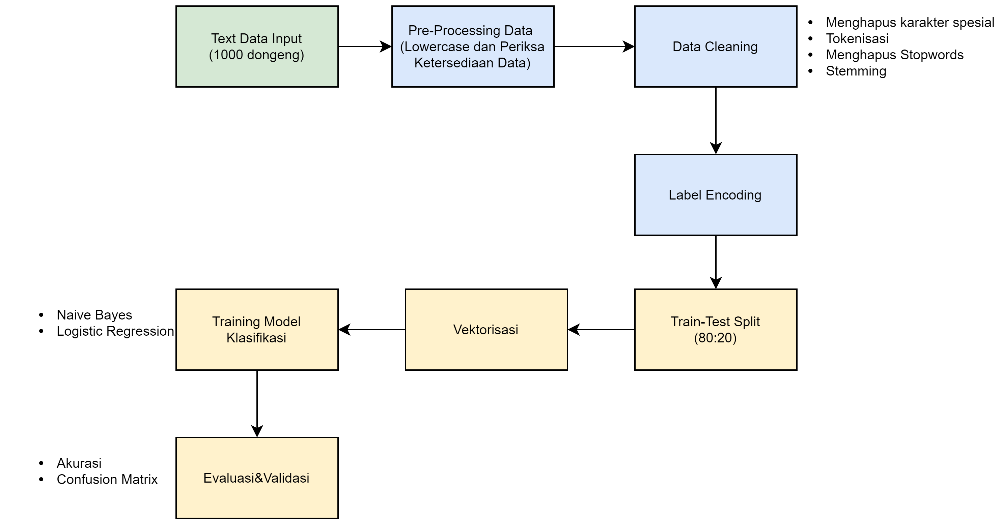

**Implementasi**


Kode program yang dibuat diadaptasi dari sumber

https://towardsdatascience.com/naive-bayes-and-lstm-based-classifier-models-63d521a48c20

https://medium.com/analytics-vidhya/applying-text-classification-using-logistic-regression-a-comparison-between-bow-and-tf-idf-1f1ed1b83640

Notebook ini bisa diakses melalui: https://colab.research.google.com/drive/1MMeFN-5GKJDWijZGl4KYjNaLlKI-3Jy3?usp=sharing

**Text Classification pada data "1000 dongeng" dengan menggunakan Multinomial Naive Bayes dan Logistic Regression**


Naive Bayes Classifier merupakan model yang menggunakan language model untuk menetapkan label kelas ke beberapa contoh berdasarkan serangkaian fitur yang dapat di representasikan secara numerik dengan menggunakan teknik statistil. Statistical language model merupakan distribusi probabilitas atas urutan kata yang dapat digunakan untuk memprediksi kata berikutnya untuk pembuatan teks dan banyak aplikasi lainnya.

Selain model Naive Bayes, text classification dapat dilakukan dengan menggunakan model machine learning seperti SVM dan logistic regression.
Contoh aplikasi dari text classification dengan teknik statistik ialah analisis sentimen. Pada kesempatan kali ini, model klasifikasi dibuat untuk analisis sentimen pada data "1000 dongeng" dimana kalimat-kalimat pada dongeng akan dikategorikan ke dalam beberapa kelas yang merepresentasikan emosi dari kalimat tersebut.
Pada pembuatan model kali ini akan membandingkan hasil klasifikasi antara model naive bayes dengan logistic regression.


**Langkah 1: Import modul dan dataset "1000 dongeng"**

In [ ]:

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords, wordnet
from nltk.stem import WordNetLemmatizer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter, defaultdict
from sklearn.model_selection import train_test_split
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import accuracy_score, classification_report


In [ ]:
#upload dataset
from google.colab import files
files.upload()

Saving 1000 data dongeng.xlsx to 1000 data dongeng.xlsx


{'1000 data dongeng.xlsx': b'PK\x03\x04\x14\x00\x06\x00\x08\x00\x00\x00!\x00!\x8cF:s\x01\x00\x00\x8c\x05\x00\x00\x13\x00\x08\x02[Content_Types].xml \xa2\x04\x02(\xa0\x00\x02\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x0

In [ ]:
data = pd.read_excel('1000 data dongeng.xlsx')
data.head()

,kalimat,sentiment
0,"Ketika kedua kalinya sang ibu menghampirinya, ...",marah
1,Pangeran Empang Kuala murka mendengar pinangan...,marah
2,Bujang Kelana akan menantang Pendekar Katung u...,marah
3,Pendekar Katung yang tidak terima dengan kekal...,marah
4,Ibunya sangat marah. ‘’ Dasar bodoh! Baju kesa...,marah


**Langkah 2: Pre-Processing Data**

1. Lowercase

Semua huruf pada teks dalam kolom kalimat pada dokumen dikonversikan menjadi huruf kecil seluruhnya. Karena teks pada kolom target sentiment sudah seluruhnya berhuruf kecil (lowercase), maka pada tahap ini teks yang dikonfersikan menjadi huruf kecil (lowercase) hanya pada teks 'kalimat'.

Proses ini dilakukan untuk memperlakukan dua kata yang memiliki arti sama namun penulisannya berbeda **[1]**. Misal 'Marah' dan 'marah' yang keduanya memiliki arti sama namun penulisan kedua kata tersebut berbeda.

In [ ]:
def preprocess_data(data):
    data['kalimat'] = data['kalimat'].str.strip().str.lower()
    return data

data = preprocess_data(data)
print("Data shape - ", data.shape, "\n")                                  #prints the number of rows and columns

for col in data.columns:
    print("The number of null values - ", col, data[col].isnull().sum())
#prints the number of null values in each column
data.head()

Data shape -  (1000, 2) 

The number of null values -  kalimat 0
The number of null values -  sentiment 0


,kalimat,sentiment
0,"ketika kedua kalinya sang ibu menghampirinya, ...",marah
1,pangeran empang kuala murka mendengar pinangan...,marah
2,bujang kelana akan menantang pendekar katung u...,marah
3,pendekar katung yang tidak terima dengan kekal...,marah
4,ibunya sangat marah. ‘’ dasar bodoh! baju kesa...,marah


Bredasarkan perintah di atas, data "1000 dongeng" yang digunakan terdiri dari 1000 data yang terdiri dari kalimat dan sentiment yang merepresentasikan emosi yang mendeskripsikan kalimat.

Tahap selanjutnya adalah mengimport library python 'sastrawi' yang akan digunakan dalam data cleansing. Library python 'Sastrawi' adalah library sederhana yang digunakan untuk mereduksi kata-kata infleksi dalam Bahasa Indonesia (Bahasa Indonesia) ke bentuk dasarnya (stem)**[2]**. Setelah menginstall library 'sastrawi' tahap selanjutnya adalah mengimport modul sastrawi agar dapat digunakan pada tahap selanjutnya. Selain itu 'punkt', dan 'wordnet' yang tersedia pada library nltk diunduh untuk digunakan dalam proses data cleaning. karena pada pembuatan model ini menggunakan teks dalam bahasa indonesia, maka 'stopwords' yang digunakan yaitu stopwords yang tersedia pada modul sastrawi.


**Langkah 3: Data Cleansing**

-Menghapus Karakter yang Tidak Diinginkan
Pada tahap ini dilakukan penghapusan semua karakter selain huruf dan spasi yang ada pada teks. Tahap ini dilakukan agar tidak ada tanda baca yang terdeteksi sebagai token (kata) pada proses tokenisasi.

-Melakukan Tokenisasi

Tokenisasi merupakan proses pemisahan teks menjadi potongan-potongan yang disebut sebagai token untuk kemudian di analisa. Kata, angka, simbol, tanda baca dan entitas penting lainnya dapat dianggap sebagai token **[3].** Oleh karena itu tokenisasi dilakukan setelah menghapus karakter yang tidak diperlukan.  

-Menghapus Stopwords pada Teks Dokumen

Tahap pertama dalam data cleansing adalah menhapus stopwords pada teks dokumen yang menjadi input dalam model yang dibangun. Stopwords merupakan kata-kata yang tidak banyak menambahkan arti pada sebuah kalimat dan dapat diabaikan tanpa menghilangkan arti dari kalimat tersebut **[4]**. Sehingga dengan dihapusnya stopwords, hasil dari analisis sentimen menjadi lebih berarti. Model yang akan dibangun kali ini menggunakan data "1000 dongeng" yang berbahasa indonesia, oleh karena itu stopwords yang digunakan merupakan stopwords dalam bahasa indonesia yang tersedia pada modul sastrawi yang telah dijelaskan sebelumnya. Stopwords dalam bahawa indonesia antara lain ialah 'yang', 'pada', 'ke' dan lain sebagainya yang ditunjukkan pada perintah di bawah ini. Pada tahap ini stopwords dihapus dari data yang telah ditokenisasi.

-Stemming

Stemming merupakan proses yang dilakukan untuk menghilangkan infleksi kata menjadi bentuk dasarnya namun tidak memiliki arti yang sama dengan kata akarnya **[3]**. Stemming dilakukan pada data yang telah di tokenisasi dan yang telah dibersihkan.

In [ ]:
pip install Sastrawi

In [ ]:
import Sastrawi
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
factory = StopWordRemoverFactory()
stopwords = factory.get_stop_words()
print(stopwords)

['yang', 'untuk', 'pada', 'ke', 'para', 'namun', 'menurut', 'antara', 'dia', 'dua', 'ia', 'seperti', 'jika', 'jika', 'sehingga', 'kembali', 'dan', 'tidak', 'ini', 'karena', 'kepada', 'oleh', 'saat', 'harus', 'sementara', 'setelah', 'belum', 'kami', 'sekitar', 'bagi', 'serta', 'di', 'dari', 'telah', 'sebagai', 'masih', 'hal', 'ketika', 'adalah', 'itu', 'dalam', 'bisa', 'bahwa', 'atau', 'hanya', 'kita', 'dengan', 'akan', 'juga', 'ada', 'mereka', 'sudah', 'saya', 'terhadap', 'secara', 'agar', 'lain', 'anda', 'begitu', 'mengapa', 'kenapa', 'yaitu', 'yakni', 'daripada', 'itulah', 'lagi', 'maka', 'tentang', 'demi', 'dimana', 'kemana', 'pula', 'sambil', 'sebelum', 'sesudah', 'supaya', 'guna', 'kah', 'pun', 'sampai', 'sedangkan', 'selagi', 'sementara', 'tetapi', 'apakah', 'kecuali', 'sebab', 'selain', 'seolah', 'seraya', 'seterusnya', 'tanpa', 'agak', 'boleh', 'dapat', 'dsb', 'dst', 'dll', 'dahulu', 'dulunya', 'anu', 'demikian', 'tapi', 'ingin', 'juga', 'nggak', 'mari', 'nanti', 'melainkan', '

In [ ]:
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
factory = StemmerFactory()
stemmer = factory.create_stemmer()

In [ ]:
def cleaning(data):
    clean = re.sub('<.*?>', ' ', str(data))
#menghapus karakter yang tidak diinginkan
    clean = re.sub('\'.*?\s',' ', clean)
    clean = re.sub(r'https?:\/\/.*[\r\n]*', '', clean, flags=re.MULTILINE)
    clean = re.sub(r'\<a href', ' ', clean)
    clean = re.sub(r'&amp;', '', clean)
    clean = re.sub(r'[&\/\\#^+()$~%.":*?<>{}!@]', ' ', clean)
    clean = re.sub(r'<br />', ' ', clean)
    clean = re.sub(r'\'', ' ', clean)
    clean = re.sub(r'http\S+',' ', clean)
    clean = re.sub('[^a-zA-Z0-9\.]+',' ', clean)

#mengganti karakter non alfanumerik
    return html.unescape(clean)
data['cleaned'] = data['kalimat'].apply(cleaning)

#melakukan tokenisasi
def tokenizing(data):
    review = data['cleaned']
#tokenisasi telah dilakukan
    tokens = nltk.word_tokenize(review)
    return tokens
data['tokens'] = data.apply(tokenizing, axis=1)

#menghapus stopwords
def remove_stops(data):
    my_list = data['tokens']
    meaningful_words = [w for w in my_list if not w in stopwords]  #stopwords yang dihapus adalah dari data yg telah di tokenisasi
    return (meaningful_words)
data['tokens'] = data.apply(remove_stops, axis=1)


#melakukan stemming
def stemming(data):
    my_list = data['tokens']
    stemmed_list = [stemmer.stem(word) for word in my_list]
    return (stemmed_list)
data['tokens'] = data.apply(stemming, axis=1)

def rejoin_words(data):
    my_list = data['tokens']
    joined_words = ( " ".join(my_list))
#rejoins all stemmed words
    return joined_words
data['cleaned'] = data.apply(rejoin_words, axis=1)

data.head()

,kalimat,sentiment,cleaned,tokens
0,"ketika kedua kalinya sang ibu menghampirinya, ...",marah,dua kali sang ibu hampir sang putri justru ben...,"[dua, kali, sang, ibu, hampir, sang, putri, ju..."
1,pangeran empang kuala murka mendengar pinangan...,marah,pangeran empang kuala murka dengar pinang tolak,"[pangeran, empang, kuala, murka, dengar, pinan..."
2,bujang kelana akan menantang pendekar katung u...,marah,bujang kelana tantang pendekar katung sabung ayam,"[bujang, kelana, tantang, pendekar, katung, sa..."
3,pendekar katung yang tidak terima dengan kekal...,marah,pendekar katung terima kalah perintah awal kej...,"[pendekar, katung, terima, kalah, perintah, aw..."
4,ibunya sangat marah. ‘’ dasar bodoh! baju kesa...,marah,ibu sangat marah dasar bodoh baju sayang harga...,"[ibu, sangat, marah, dasar, bodoh, baju, sayan..."


Berdasarkan hasil di atas, kini data telah dibersihkan dan telah ditokenisasi serta stemming dengan menggunakan perintah yang tertera di atas. Tokenisasi dilakukan untuk setiap teks pada data 'kalimat'. Kemudian stemming dilakukan pada data hasil tokenisasi dan yang telah dibersihkan.


Tahap selanjutnya adalah memeriksa jumlah dari setiap kelas target yaitu 'sentiment' pada dataset '1000 dongeng'.

In [ ]:
data[['sentiment']].value_counts()

sentiment
senang       278
sedih        194
terkejut     183
marah        161
takut        136
jijik         48
dtype: int64

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


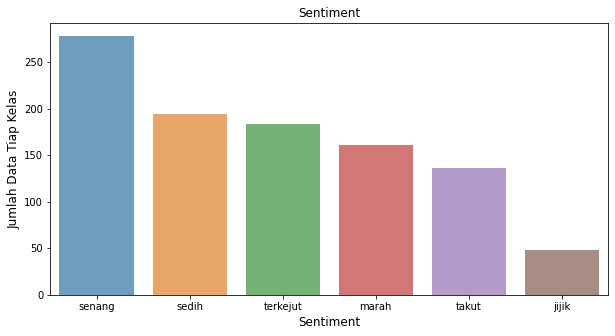

In [ ]:
kelas_sentiment = data['sentiment'].value_counts()
plt.figure(figsize=(10,5))
sns.barplot(kelas_sentiment.index, kelas_sentiment.values, alpha=0.7)
plt.title('Sentiment')
plt.ylabel('Jumlah Data Tiap Kelas', fontsize=12)
plt.xlabel('Sentiment', fontsize=12)
plt.show()

Berdasarkan hasil di atas, kita telah memiliki informasi mengenai jumlah masing-masing data pada kelas target yang merupakan 'sentiment' pada data '1000 dongeng'. Bisa kita lihat bahwa terdapat ketidakseimbangan data yaitu pada kelas sentimen 'jijik' yang hanya memiliki 48 data. Sedangkan untuk kelas sentimen lainnya memiliki jumlah data di atas 100. Hal tersebut diatasi pada tahap train test split dengan menggunakan metode StratifiedShuffleSplit yang merupakan bagian dari shuffle split yang membuat pemisahan data training dan testing dengan presentase yang sama untuk setiap kelas target.

Tahap selanjutnya adalah melakukan encoding untuk label kelas target 'sentiment' pada data '1000 dongeng'.

**Langkah 4: Label Encoding**

In [ ]:
kalimat_dongeng = data['cleaned'].values
labels = data['sentiment'].values
# menggunakan label encoder untuk encoding label, yaitu mengkonversi menjadi 0-5
encoder = LabelEncoder()
encoded_labels = encoder.fit_transform(labels)
data['encoded']= encoded_labels
print(data['encoded'].head(6))

# prints(enc.classes_)
encoder_mapping = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))
print("\nThe encoded classes are - ", encoder_mapping)

labels = data['encoded']

0    1
1    1
2    1
3    1
4    1
5    1
Name: encoded, dtype: int64

The encoded classes are -  {'jijik': 0, 'marah': 1, 'sedih': 2, 'senang': 3, 'takut': 4, 'terkejut': 5}


**Langkah 5: Train Test Split**

Tahap selanjutnya adalah melakukan train test split data dengan perbandingan 80:20 untuk training dan testing. Pembagian data target yaitu 'sentiment' dilakukan untuk setiap kelas target dengan perbandingan yang sama.

In [ ]:
from sklearn.model_selection import StratifiedShuffleSplit

In [ ]:
X = data['cleaned']
Y = labels
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=1)
for train_index, test_index in sss.split(X, Y):
  print("TRAIN:", train_index, "\nTEST:", test_index)

TRAIN: [250 120 343 739 699 414 788 319 741   7 396  61  17 552 429 596 262  81
 805  79 684 142  85  86 614 920 105 436 418 472 640 351 779 511 395 621
 389 897 831 626 405 641 550 362   1 252 721 997 740  13 674 400 628 449
 158 993 700 999 585 378 479 532 589 583 749 168 853 534 303 877 713 613
 312 377 286 689 738 294 633 816 617 160 839 458 214  45 896 298 468 281
 682 963  73 398 691 863 848 551 217 796 821 778 326 455 528  54 629 610
 886 546 443 797 218 908 370 392 875 622 748 950 249 207 995 307 133 680
 271 482 239 243 823 588 879 228 459 223 140 751 729 376 329 972 656  44
 670 408 834 663 359 438 276 442 973  68  12 869 832 116 484 296 163 510
  74 530 341 734 627 562 602 769 568 302 701 350 637 870  56 840 220 529
 257 768 772 715 542 803 962 121 819 874 813 918 985 967   8 599 103 129
 668 340  53 426 996 660 226 403 982 245 712 118 199 150 231 143 322 101
 776 664 980  66 314  28 971 154 515 136 716 952 683 681 433 590 448 206
 225 978 282 675 492 910 639 335 604 198  96

In [ ]:
# train test split
X_train, X_test = X[train_index], X[test_index]
Y_train, Y_test = Y[train_index], Y[test_index]

Y_train.value_counts()

3    223
2    155
5    146
1    129
4    109
0     38
Name: encoded, dtype: int64

Kemudian tahap selanjutnya adalah memeriksa apakah setiap kelas target telah terbagi sesuai dengan perbandingan yang telah ditentukan sebelumnya.

Berdasarkan hasil diatas, dapat disimpulkan bahwa data taeget yang menjadi data training sudah dibagi sesuai dengan perbandingan yaitu sebesar 80 persen dari data keseluruhan untuk setiap kelas target.


Kami sekarang memiliki kalimat latih dan uji serta label latih dan uji yang sesuai. Ada dua pendekatan yang mungkin untuk membangun kosakata untuk pengklasifikasi Naive Bayes -

1. Kita dapat mengambil seluruh data (train + test) untuk membangun vocab. Dengan cara ini saat menguji tidak ada kata yang keluar dari kosakata.

2. Kami hanya dapat mengambil data kereta untuk membangun vocab. Dalam hal ini, beberapa kata dari test set mungkin tidak ada dalam vocab dan oleh karena itu kita perlu melakukan pemulusan sehingga tidak ada suku probabilitas yang nol.


Kami menggunakan pendekatan ke-2 karena yang pertama adalah data intensif dengan hasil yang hampir sama. Selain itu, karena membangun vocab dengan mengambil semua kata di train set juga membutuhkan banyak memori, kami membangun vocab dengan memilih 3000 kata yang paling sering di training corpus.

Tahap selanjutnya adalah melakukan vektorisasi untuk mengonversi setiap data 'kalimat' menjadi representasi numerik sehingga dapat digunakan oleh model klasifikasi

**Langkah 6: Pembuatan Model (Naive Bayes)**

Karena machine learning tidak dapat membaca text sebagai input maka data perlu dikonverso dengan metode vektorisasi sebagaimana yang ditunjukkan oleh perintah sebagai berikut:

In [ ]:
# Menggunakan Count vectorizer untuk mendapatkan frekuensi kata
vectorizer = CountVectorizer(max_features = 3000)
X_train_vect = vectorizer.fit_transform(X_train) #melakukan vektorisasi untuk semua kalimat training
X_test_vect= vectorizer.transform(X_test) # melakukan vektorisasi untuk semua kalimat testing
#print(X_train_vect.shape, X_test_vect.shape) # print shape dari ekstrak fitur train dan test data

Tahap selanjutnya adalah membangun model classifier yang akan digunakan untuk klasifikasi teks. Disini kita akan menggunakan multinomial naive bayes dengan laplace smoothing sehingga tidak ada probabilitas yang bernilai nol.

In [ ]:
# menggunakan laplace smoothing untuk kata-kata yg ada pada test set tapi tidak ada dalam vocab train set
class MultinomialNaiveBayes:

    def __init__(self, classes, tokenizer):
      #self.tokenizer = tokenizer
      self.classes = classes

    def group_by_class(self, X, Y):
      data = dict()
      for c in self.classes:
#pengelompokkan sentiment
        data[c] = X[np.where(Y == c)]
      return data

    def fit(self, X, y):
        self.n_class_items = {}
        self.log_class_priors = {}
        self.word_counts = {}
        self.vocab = vocab
#dengan menggunakan 3000 vocab pada kata-kata di training set

        n = len(X)

        grouped_data = self.group_by_class(X, Y)

        for c, data in grouped_data.items():
          self.n_class_items[c] = len(data)
          self.log_class_priors[c]=math.log(self.n_class_items[c]/n)
#menggunakan log untuk perhitungan yg lebih mudah
          self.word_counts[c] = defaultdict(lambda: 0)

          for text in data:
            counts = Counter(nltk.word_tokenize(text))
            for word, count in counts.items():
                self.word_counts[c][word] += count

        return self
    def laplace_smoothing(self, word, text_class):          #smoothing
      num = self.word_counts[text_class][word] + 1
      denom = self.n_class_items[text_class] + len(self.vocab)
      return math.log(num / denom)

    def predict(self, X):
        result = []
        for text in X:

          class_scores = {c: self.log_class_priors[c] for c in self.classes}

          words = set(nltk.word_tokenize(text))
          for word in words:
              if word not in self.vocab: continue

              for c in self.classes:

                log_w_given_c = self.laplace_smoothing(word, c)
                class_scores[c] += log_w_given_c

          result.append(max(class_scores, key=class_scores.get))

        return result

**Langkah 7: Evaluasi Model Naive Bayes**

Model klasifikasi multinomial naive bayes telah dibangun dan dilatih dengan data training yang sudah dibagi pada tahap sebelumnya. Dengan menggunakan perintah di bawah kita akan mendapatkan nilai parameter evaluasi salah satunya ialah akurasi yang mendeskripsikan performa dari model yang telah dibangun.



In [ ]:
MNB = MultinomialNB()
%time MNB.fit(X_train_vect, Y_train) # excecution time dalam training model
# mencetak akurasi model yang dihasilkan
predicted_labels = MNB.predict(X_test_vect)
print("Akurasi model MNB ", accuracy_score(Y_test, predicted_labels))
print("\nThe classification report with metrics - \n", classification_report(Y_test, predicted_labels))

CPU times: user 3.41 ms, sys: 3 µs, total: 3.41 ms
Wall time: 3.54 ms
Akurasi model MNB  0.835

The classification report with metrics - 
               precision    recall  f1-score   support

           0       1.00      0.57      0.73         7
           1       0.74      0.71      0.72        24
           2       0.92      0.81      0.86        42
           3       0.81      0.93      0.87        60
           4       0.88      0.79      0.83        28
           5       0.81      0.87      0.84        39

    accuracy                           0.83       200
   macro avg       0.86      0.78      0.81       200
weighted avg       0.84      0.83      0.83       200



Berdasarkan hasil percobaan, diperoleh nilain akurasi terbaik yang dihasilkan oleh model MNB ialah sebesar 83% dengan random state 1. Tahap selanjutnya adalah menampilkan confusion matrix sebagai berikut:

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
cm = confusion_matrix(Y_test, predicted_labels)
print(cm)

[[ 0  0  5  0  0  2]
 [ 1  5  8 11  0  5]
 [ 0  5  5 13  5  9]
 [ 1  3  6 18 10 14]
 [ 1  4  6 11  2  3]
 [ 1  6  7 16  8  9]]


**Langkah 8: Pembuatan Model Logistic Regression**

Logistic Regression adalah adalah algoritma klasifikasi Machine Learning yang digunakan untuk memprediksi probabilitas variabel dependen categorical. Pada logistic regression, variabel dependen adalah variabel biner yang berisi data berkode 1  atau 0 . Dengan kata lain, model logistic regression memprediksi P(Y=1) sebagai fungsi dari X **[5]**.

Model machine learning logistic regression bekerja pada data numerik. Sehingga sebelum melakukan pemodelan kita perlu melakukan konfersi data 'kalimat' menjadi vektor angka **[4]**.

In [ ]:
import re
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest, chi2
from sqlite3 import Error
from sklearn.ensemble import RandomForestClassifier
import sqlite3
import pickle
%matplotlib inline

In [ ]:
final_features = vectorizer.fit_transform(data['cleaned']).toarray()
final_features.shape

(1000, 1710)

In [ ]:
from sklearn.linear_model import LogisticRegression
X = data['cleaned']
Y = labels
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.20)

pipeline = Pipeline([('vect', vectorizer),
                     ('chi',  SelectKBest(chi2, k=1200)),
                     ('clf', LogisticRegression(random_state=42))])

model = pipeline.fit(X_train, Y_train)
with open('LogisticRegression.pickle', 'wb') as f:
    pickle.dump(model, f)

Ytest = np.array(Y_test)
%time model.fit(X_train, Y_train) # excecution time dalam training model
# confusion matrix and classification report(precision, recall, F1-score)
print(classification_report(Y_test, model.predict(X_test)))
print(confusion_matrix(Y_test, model.predict(X_test)))

CPU times: user 83.7 ms, sys: 920 µs, total: 84.6 ms
Wall time: 84.8 ms
              precision    recall  f1-score   support

           0       0.71      0.56      0.63         9
           1       0.80      0.89      0.84        27
           2       0.85      0.90      0.88        39
           3       0.91      0.97      0.94        60
           4       0.95      0.75      0.84        24
           5       0.95      0.90      0.92        41

    accuracy                           0.89       200
   macro avg       0.86      0.83      0.84       200
weighted avg       0.89      0.89      0.88       200

[[ 5  0  1  2  0  1]
 [ 0 24  1  2  0  0]
 [ 2  2 35  0  0  0]
 [ 0  1  1 58  0  0]
 [ 0  3  2  0 18  1]
 [ 0  0  1  2  1 37]]


Berdasarkan hasil percobaan diperoleh hasil akurasi terbaik dari model logistic regression ialah sebesar 89% dengan random state 42.

**Analisis Perbandingan Hasil Model Klasifikasi**

Berdasarkan hasil klasifikasi dari kedua model yang digunakan (multinomial naive bayes dan logistic regression), nilai akurasi yang dihasilkan oleh model logistic regression lebih besar dibandingkan dengan model multinomial naive bayes. Untuk model Naive Bayes, nilai akurasi terbaik dihasilkan sebesar 83% dengan random state=1. Sedangkan untuk model Logistic Regression, nilai akurasi terbaik dihasilkan sebesar 89% pada random state sebesar 42. Selain itu secara keseluruhan, waktu eksekusi naive bayes memakan waktu yang lebih singkat dibandingkan waktu eksekusi training dari model Logistic Regression.

Perbedaan hasil dari kedua model tersebut dapat diakibatkan oleh perbedaan dari cara kerja masing-masing algoritma. Naïve bayes merupakan model generative dan logistic regression merupakan model diskriminatif. Model naïve bayes bekerja dengan memodelkan distribusi gabungan dari fitur X dan target Y kemudian memprediksi probabilitas posterior yang diberikan sebagai P(y|x). Selain itu, waktu eksekusi naive bayes yang lebih singkat dibanding logistic regression dapat dikarenakan oleh model naive bayes yang merupakan model yang menggunakan sedikit parameter yang dapat dihitung.


Sehingga dapat disimpulkan bahwa model Naive Bayes memiliki keuntungan yang terdiri dari:

1. membutuhkan waktu yang singkat untuk pelatihan dan prediksi

2. memberikan prediksi probabilistik langsung

3. mudah ditafsirkan

4. menggunakan seikit parameter yang dapat dihitung


Model Logistic Regression bekerja secara langsung dengan memodelkan probabilitas posterior P(y|x) dengan mempelajari pemetaan input ke output dengan meminimalkan kesalahan. Probabilitas posterior merupakan probabilitas peristiwa A terjadi mengingat peristiwa B telah terjadi **[6]**.


Naive Bayes mengasumsikan bahwa fitur-fitur pada data independen secara kondisional**[7]**. Namun pada praktiknya dataset tidak selalu benar-benar independen namun masih bisa berdekatan. Sehingga Naive Bayes memiliki bias yang lebih tinggi dengan varians yang lebih rendah dibanding logistic regression. Hal tersebut dibuktikan dari hasil percobaan dimana secara keseluruhan, nilai akurasi logistic regression lebih besar dibanding naive bayes untuk semua variasi random state. Perbedaan lainnya antara model logistic regression dengan naive bayes ialah model Logistic regression bekerja dengan membuat prediksi untuk probabilitas menggunakan bentuk langsung fungsional sedangkan naive bayes dapat mengetahui bagaimana data dihasilkan berdasarkan hasil.

**Analisis Hasil Evaluasi dengan Confusion Matrix**

Hasil evaluasi model yang digunakan dalam text classification divisualisasikan dengan menggunakan confusion matrix. Confusion matrix menunjukkan nilai True Negative (TN), True Positive (TP), False Negative (FN), dan False Positive (FP). Nilai yang tertera pada diagonal confusion matrix merupakan nilai True Positive (TP). Apabila kita bandingkan confusion matrix hasil model Naive Bayes dengan Logistic Regression, nilai pada diagonal confusion matrix logistic regression lebih besar dibanding model naive bayes. Hal tersebut sesuai dengan teori yang mengatakan bahwa semakin tinggi nilai Tp maka semakin baik kemampuan prediksi model **[8]**.


**Daftar Pustaka**

  [1]I. Ismiguzel, “Applying text classification using logistic regression,” Analytics Vidhya, Sep. 28, 2021. Accessed: Apr. 06, 2022. [Online]. Available: https://medium.com/analytics-vidhya/applying-text-classification-using-logistic-regression-a-comparison-between-bow-and-tf-idf-1f1ed1b83640
  
  
  [2]“Sastrawi,” PyPI. https://pypi.org/project/Sastrawi/ (accessed Apr. 06, 2022).
  
  [3]K. S. Nugroho, “Dasar Text Preprocessing dengan Python - Kuncahyo Setyo Nugroho,” Medium, Jun. 04, 2020. Accessed: Apr. 06, 2022. [Online]. Available: https://ksnugroho.medium.com/dasar-text-preprocessing-dengan-python-a4fa52608ffe


  [4]I. Ismiguzel, “Applying text classification using logistic regression,” Analytics Vidhya, Sep. 28, 2021. Accessed: Apr. 06, 2022. [Online]. Available: https://medium.com/analytics-vidhya/applying-text-classification-using-logistic-regression-a-comparison-between-bow-and-tf-idf-1f1ed1b83640


  [5]S. Li, “Multi-Class text classification with scikit-learn,” Towards Data Science, Feb. 20, 2018. Accessed: Apr. 06, 2022. [Online]. Available: https://towardsdatascience.com/multi-class-text-classification-with-scikit-learn-12f1e60e0a9f


  [6]S. Li, “Building A logistic regression in python, step by step,” Towards Data Science, Feb. 27, 2019. Accessed: Apr. 06, 2022. [Online]. Available: https://towardsdatascience.com/building-a-logistic-regression-in-python-step-by-step-becd4d56c9c8
  
  
  [7]Christopher OttesenChristopher OttesenView all of Christopher Ottesen’s posts., “Comparison between naïve bayes and logistic regression – DataEspresso.” https://dataespresso.com/en/2017/10/24/comparison-between-naive-bayes-and-logistic-regression/ (accessed Apr. 06, 2022).

  
  [8]S. Loukas, “ROC Curve explained using a COVID-19 hypothetical example: Binary & Multi-Class Classification tutorial,” Towards Data Science, Jun. 14, 2020. Accessed: Apr. 06, 2022. [Online]. Available: https://towardsdatascience.com/roc-curve-explained-using-a-covid-19-hypothetical-example-binary-multi-class-classification-bab188ea869c
